# Анализ рынка заведений общественного питания Москвы

1. Контекст задачи: нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года, нужно его проанализировать.
2. Цель проекта: подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места, а также ответить на их вопросы касательно открытия собственной кофейни.
3. Задачи проекта:
* [Загрузка данных и анализ общей информации](#1)
* [Предобработка данных](#2)
* [Анализ данных](#3)
* [Общий вывод](#4)
* [Детализировать исследование: открытие кофейни](#5)
* Подготовить презентацию
4. Описание данных:
  Файл moscow_places.csv:
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽». и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  * 0 — заведение не является сетевым
  * 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

Презентация: https://docs.google.com/presentation/d/1lhhiA-5biB7GCyprzV5MRQjnPhLfs_tqfunfV2ytXV8/edit?usp=sharing

Пдф: https://disk.yandex.ru/i/-BAjpWSI20dj0A

---

<a id="1"></a>

## Загрузка данных и анализ общей информации
---

In [4]:
!pip install plotly

In [5]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [6]:

path1 = '/datasets/moscow_places.csv'
path2 = 'moscow_places.csv'

if os.path.exists(path1):
    data = pd.read_csv(path1)
else:
    data = pd.read_csv(path2)

In [7]:
display(data.info())
display(data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Можем заметить, что нам предоставлена информация о 8406 заведениях. Во многих столбцах видны пропуски, поскольку значений в них меньше чем всего заведений. Некоторые пропуски в определенных столбцах представлены еще в условии, остальные пока что неизвестны. Также на первый взгляд видно, что у столбца seats неверный тип данных, поскольку количество сидений не может быть не целым, у остальных, кажется, соответствующие типы данных.

---

<a id="2"></a>

## Предобработка данных

In [11]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [12]:
data[['name', 'address']].duplicated().sum()

4

In [13]:
data.loc[data[['name', 'address']].duplicated(), :]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [14]:
data = data.drop_duplicates(subset = ['name', 'address'])
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [15]:
display(data.duplicated().sum())
data[['name', 'address']].duplicated().sum()

0

0

Дубликатов нет

-------------

In [18]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Столбец middle_coffee_cup мы изменять не будем, поскольку пропусков уж слишком много, и мы не можем заменять их на другие значения, в общем то и брать их неоткуда. В столбце middle_avg_bill заменим пропуски на медианное значения из других заведений такой же категории и с того же района. Пропуски в avg_bill заменять нет смысла, все данные оттуда распределяются на другие столбцы.

In [20]:
data_grouped = data.groupby(['district', 'category'], as_index = False)[['middle_avg_bill', 'seats']].agg({'middle_avg_bill': 'median', 'seats':'median'})
data_grouped['seats'] = data_grouped['seats'].round()
data_grouped

,district,category,middle_avg_bill,seats
0,Восточный административный округ,"бар,паб",1200.0,96.0
1,Восточный административный округ,булочная,300.0,36.0
2,Восточный административный округ,быстрое питание,375.0,40.0
3,Восточный административный округ,кафе,450.0,48.0
4,Восточный административный округ,кофейня,400.0,55.0
...,...,...,...,...
67,Южный административный округ,кафе,600.0,45.0
68,Южный административный округ,кофейня,387.5,80.0
69,Южный административный округ,пиццерия,500.0,45.0
70,Южный административный округ,ресторан,975.0,95.0


In [21]:
data['middle_avg_bill'] = data.apply(lambda x: data_grouped.loc[
                  (x['district'] == data_grouped['district']) &
                  (x['category'] == data_grouped['category']), 'middle_avg_bill'].iloc[0] if pd.isna(x['middle_avg_bill'])
                                     else x['middle_avg_bill'], axis = 1)

In [22]:
display(data.isna().sum())
display(data.head())

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill         0
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,550.0,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


---

Избавимся от пропусков в столбце price

,middle_avg_bill
price,
высокие,2000.0
выше среднего,1250.0
низкие,257.5
средние,500.0


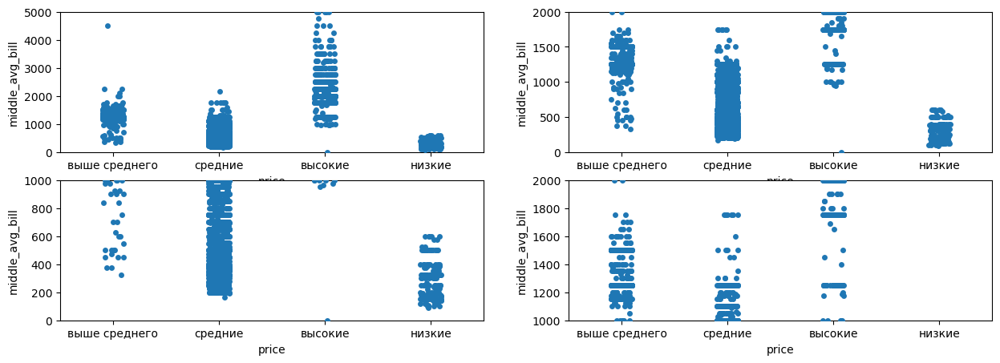

In [25]:
price = data.groupby('price').agg({'middle_avg_bill': 'median'})
display(price)

plt.figure(figsize = (15, 5))
plt.subplot(2, 2, 1)
sns.stripplot(x = 'price', y = 'middle_avg_bill', data = data)
plt.ylim(0, 5000)

plt.subplot(2, 2, 2)
sns.stripplot(x = 'price', y = 'middle_avg_bill', data = data)
plt.ylim(0, 2000)

plt.subplot(2, 2, 3)
sns.stripplot(x = 'price', y = 'middle_avg_bill', data = data)
plt.ylim(0, 1000)

plt.subplot(2, 2, 4)
sns.stripplot(x = 'price', y = 'middle_avg_bill', data = data)
plt.ylim(1000, 2000)

plt.show()

Судя по графикам и таблице, будем предполагать:

* низкие цены - средний чек до 550

* средние - до 1100

* выше средных - до 1600

* высокие - свыше 1600

In [27]:
def set_price(row):
    if pd.isna(row['price']):
        if row['middle_avg_bill'] <= 550:
            return 'низкие'
        elif row['middle_avg_bill'] <= 1100:
            return 'средние'
        elif row['middle_avg_bill'] <= 1600:
            return 'выше среднего'
        else:
            return 'высокие'
    else:
        return row['price']

data['price'] = data.apply(set_price, axis = 1)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,низкие,NaN,550.0,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


---

Там где хотели исправить, пропусков больше нет.

---

Создадим необходимые столбцы

In [32]:
data['street'] = 'value'
data['street'] = data.apply(lambda x: x['address'][8:], axis = 1)
data['street'] = data['street'].str.extract(r'(.+?),')[0]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,низкие,NaN,550.0,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


In [33]:
data['is_24_7'] = True
data['is_24_7'] = data.apply(lambda x: True if x['hours'] == 'ежедневно, круглосуточно' else False, axis = 1)
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,низкие,NaN,550.0,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,650.0,NaN,0,NaN,ижорская улица,False
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица,False
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,клязьминская улица,False
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,ангарская улица,False


Добавили необходимые столбцы

---

<a id="3"></a>

## Анализ данных

---

### Количество заведений по категориям

In [39]:
data_category = data.groupby('category', as_index = False)['name'].count().sort_values(by = 'name', ascending = False)
data_category

,category,name
3,кафе,2376
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


Нам представлены все категории заведений, которые есть в данных. Первая тройка ушла с отрывом: кафе, ресторан, кофейня. На последнем же месте булочные.

In [41]:
fig1 = go.Bar(x = data_category['category'], y = data_category['name'])
fig2 = go.Pie(labels = data_category['category'], values = data_category['name'])
fig = make_subplots(rows = 1, cols = 2, specs=[[{"type": "xy"}, {"type": "domain"}]])
fig.add_trace(fig1, row = 1, col = 1)
fig.add_trace(fig2, row = 1, col = 2)
fig.update_layout(title = dict(text = 'Количество заведений по категориям'),height = 500, width = 900)
fig.show()

Благодаря визуализации можем убедиться в этом.

---

### Количество посадочных мест в заведениях по категориям

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


/var/folders/td/s_0q2gb952xg9pgq3lhgqw740000gn/T/ipykernel_50575/1424963420.py:11: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



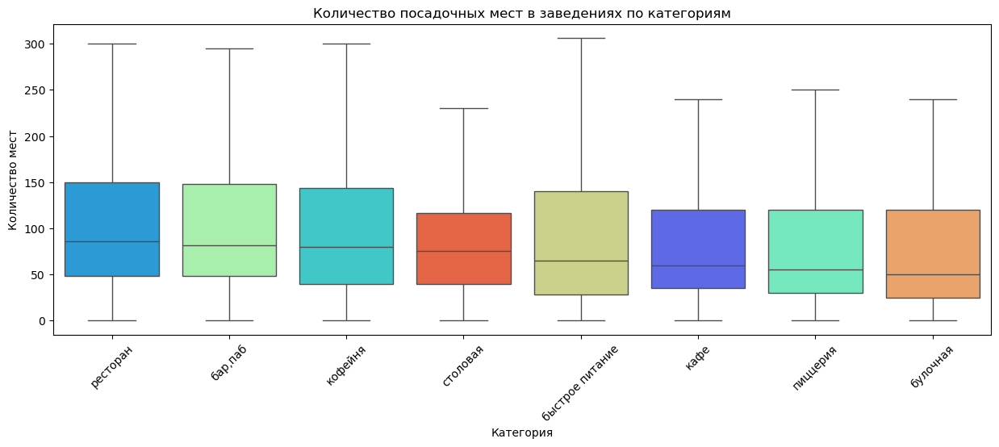

In [45]:
data_seats = data.groupby('category', as_index = False)[['seats']].median().sort_values(by = 'seats', ascending = False)
counts = data_seats['category'].tolist()
display(data_seats)

plt.figure(figsize = (15, 5))
sns.boxplot(x = 'category', y = 'seats', data=data, hue = 'category', palette = 'rainbow', order = counts, showfliers = False)
plt.xticks(rotation = 45)
plt.title('Количество посадочных мест в заведениях по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.legend().remove()
plt.show()

Можем заметить, что чаще всего высокие значения появляются у ресторанов, баров, столовых, это видно по медианам, и распеределениям, и по таблице. Далее идут кофейня, быстрое питание и тд. Меньше всего мест у категории: булочная. В таблице у всех категорий медианное значение вышло меньше 100 посадочных мест.

---

### Соотношение сетевых и несетевых заведений

In [49]:
data_chain = data.groupby(['chain'], as_index = False)[['name']].count().rename(columns = {'name':'count'})
data_chain['chain'] = data_chain['chain'].astype(str).replace({'0':'Несетевое', '1':'Сетевое'})
data_chain['ratio'] = round(data_chain['count'] / data_chain['count'].sum(), 2)
display(data_chain)

fig = px.pie(data_chain, names = 'chain', values = 'count', title = 'Соотношение сетевых и несетевых заведений',
            width = 700, height = 600)
fig.show()

,chain,count,ratio
0,Несетевое,5199,0.62
1,Сетевое,3203,0.38


Несетевых заведений с отрывом больше чем сетевых. Тем не менее сетевые заведения занимают практически 40% рынка.

---

### Доли категорий в сетевых и несетевых заведений

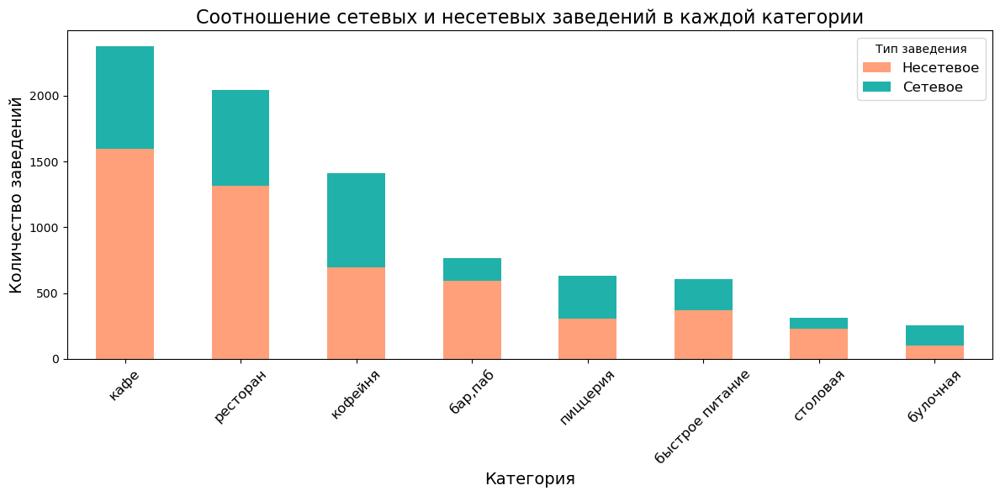

In [53]:
data_chain = data.groupby(['chain', 'category'], as_index=False)[['name']].count().rename(columns={'name': 'count'})
data_chain['chain'] = data_chain['chain'].astype(str).replace({'0': 'Несетевое', '1': 'Сетевое'})
pivot_data = data_chain.pivot(index='category', columns='chain', values='count').fillna(0)
pivot_data['total'] = pivot_data['Несетевое'] + pivot_data['Сетевое']
pivot_data = pivot_data.sort_values(by = 'total', ascending = False).drop(columns = ['total'])

pivot_data.plot(kind='bar', stacked=True, figsize=(12, 6), color=['#FFA07A', '#20B2AA'])
plt.title('Соотношение сетевых и несетевых заведений в каждой категории', fontsize=16)
plt.xlabel('Категория', fontsize=14)
plt.ylabel('Количество заведений', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Тип заведения', fontsize=12)
plt.tight_layout()
plt.show()

И в сетевых и несетевых категория "Кафе" имеет большее количество. Однако у несетевых разница между первым местом и остальным более явная чем в сетевых. Также можем заметить, что в несетевых разница между категориями "Ресторан" и "Кофейня" равна почти 12%, когда в сетевых разница составляет всего 0,3%. В несетевых категория "Бар, паб" находится на одну позицию выше чем "Пиццерия", а в сетевых наоборот, причем доли равны соответственно позиции. Также в сетевых местами поменялись категории "Столовая" и "Булочная". Сетевыми чаще всего являются такие заведения: ресторан, кафе и кофейня. Реже всего: бар/паб, столовая и булочная.

---

### Топ-15 популярных сетей в Москве

In [57]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,низкие,NaN,550.0,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


In [58]:
top15 = data.query('chain == 1').groupby('name', as_index = False)[['address']].count().rename(columns = {'address':'count'}).sort_values('count', ascending = False).head(15)
names = top15['name'].tolist()
data_top15 = data.query('name in @names').groupby('name', as_index = False).agg({'category':lambda x: x.mode()[0],
                                                                             'district':lambda x: x.mode()[0],
                                                                            'rating':'median',
                                                                            'middle_avg_bill':'median',
                                                                            'address':'count'})
data_top15 = data_top15.rename(columns = {'address':'count'}).sort_values('count', ascending = False).reset_index(drop = True)
display(data_top15)
print(f"Перед нами таблица топ-15 сетей Москвы. Мы можем заметить, что их объединяет. А именно рейтинг заведений, который находится в промежутке от {data_top15['rating'].min()} до {data_top15['rating'].max()}; а вот средний чек от {data_top15['middle_avg_bill'].min()} до {data_top15['middle_avg_bill'].max()}, что может быть большой разницей")

,name,category,district,rating,middle_avg_bill,count
0,шоколадница,кофейня,Центральный административный округ,4.20,500.0,120
1,домино'с пицца,пиццерия,Южный административный округ,4.20,500.0,77
2,додо пицца,пиццерия,Южный административный округ,4.30,396.0,74
3,one price coffee,кофейня,Центральный административный округ,4.20,387.5,72
4,яндекс лавка,ресторан,Восточный административный округ,4.00,1000.0,69
5,cofix,кофейня,Центральный административный округ,4.10,387.5,65
6,prime,ресторан,Центральный административный округ,4.20,637.5,50
7,хинкальная,кафе,Центральный административный округ,4.40,700.0,44
8,кофепорт,кофейня,Центральный административный округ,4.20,500.0,42
9,кулинарная лавка братьев караваевых,кафе,Центральный административный округ,4.40,475.0,39


Перед нами таблица топ-15 сетей Москвы. Мы можем заметить, что их объединяет. А именно рейтинг заведений, который находится в промежутке от 4.0 до 4.4; а вот средний чек от 375.0 до 1000.0, что может быть большой разницей


In [59]:
fig = px.bar(data_top15.sort_values('count', ascending = True), x = 'count', y = 'name', title = 'Количество заведений у топ-15 сетей')
fig.update_layout(height = 700, width = 1000)
fig.update_yaxes(title = 'Сети')
fig.update_xaxes(title = 'Количество')
fig.show()

fig1 = px.bar(data_top15, x = 'name', y = 'count', color = 'category', title = 'Категории топ-15 сетей')
fig1.update_layout(height = 500, width = 1000)
fig1.update_xaxes(title = 'Сети')
fig1.update_yaxes(title = 'Количество')
fig1.show()

fig2 = px.bar(data_top15, x = 'name', y = 'count', color = 'district', title = 'Расположение топ-15 сетей')
fig2.update_layout(height = 500, width = 1000)
fig2.update_xaxes(title = 'Сети')
fig2.update_yaxes(title = 'Количество')
fig2.show()

На первом месте сеть "Шоколадница" с 120 заведениями, на 15 месте сеть "Му-Му" с 27 заведениями. Под общим можно сказать, что больше всего заведений категории "кофейня". Стоит уточнить, что в топ вошли не все категории, а именно: кофейня, кафе, ресторан, пиццерия, булочная(в порядке убывания по количеству категорий из топ-15). А также большинство заведений из топ-15 сетей находится в Центральном административном округе. Рекомендация: изучить районы, в которых нет большинства заведений из топ-15 сетей.

---

### Количество заведений каждой категории по районам

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,234,193,77,188,41,898
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Западный административный округ,50,37,62,238,150,71,218,24,850
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


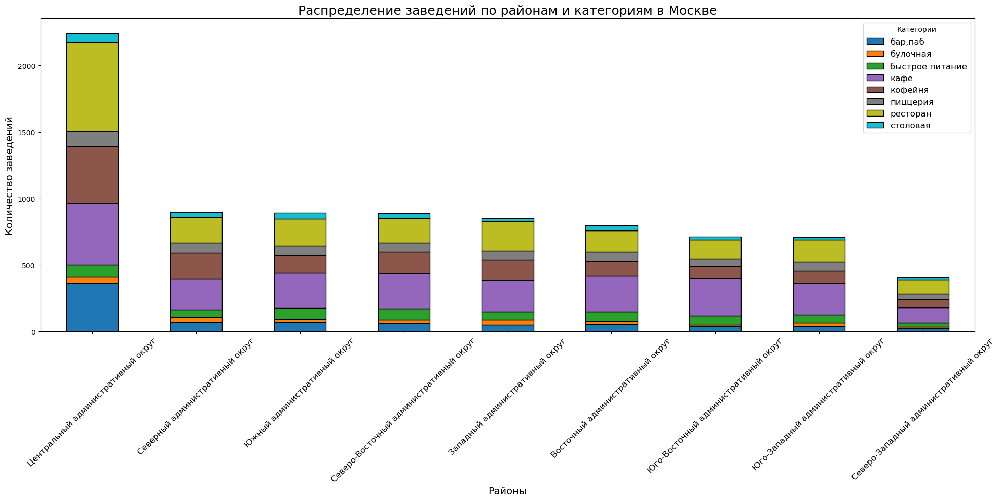

In [63]:
data_district = data.groupby(['district', 'category'], as_index = False)['address'].count().rename(columns={'address': 'count'})
stacked_data = data_district.pivot(index='district', columns='category', values='count').fillna(0)
stacked_data['total'] = stacked_data.sum(axis=1)
stacked_data.sort_values(by = 'total', ascending = False, inplace = True)
display(stacked_data)

stacked_data.drop(columns='total').plot(kind='bar', stacked=True, figsize=(20, 10), colormap='tab10', edgecolor='black')
plt.xticks(rotation=45, fontsize=12)
plt.title('Распределение заведений по районам и категориям в Москве', fontsize=18)
plt.xlabel('Районы', fontsize=14)
plt.ylabel('Количество заведений', fontsize=14)
plt.legend(title='Категории', fontsize=12)
plt.tight_layout()
plt.show()

График получился великоватым, зато все вместил! На графике можем заметить, что в ЦАО выделяется количество заведений. Больше всего ресторанов, далее идут кафе, кофейня, бар/паб и тд. Хоть явным лидером и является ЦАО, но по сравнению с количеством всех заведений его величина меркнет. У всех остальныэ округов видно лидерство категории "кафе", а меньше всего количества заведений у всех округов категории "булочная".

---

###  Распределение средних рейтингов по категориям заведений

In [67]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,низкие,NaN,550.0,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


['бар,паб',
 'булочная',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая',
 'быстрое питание',
 'кафе']

/var/folders/td/s_0q2gb952xg9pgq3lhgqw740000gn/T/ipykernel_50575/2897635694.py:10: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



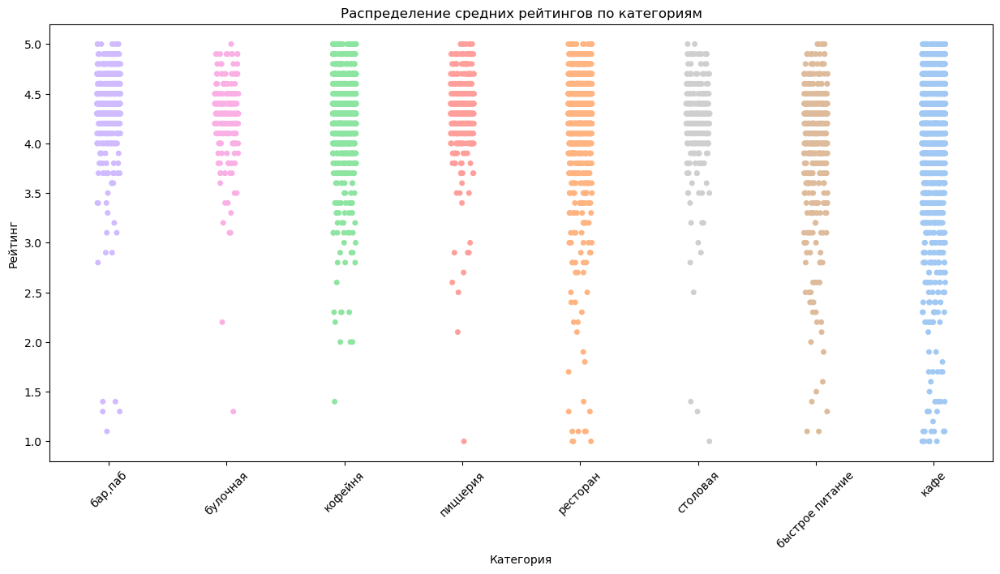

/var/folders/td/s_0q2gb952xg9pgq3lhgqw740000gn/T/ipykernel_50575/2897635694.py:19: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



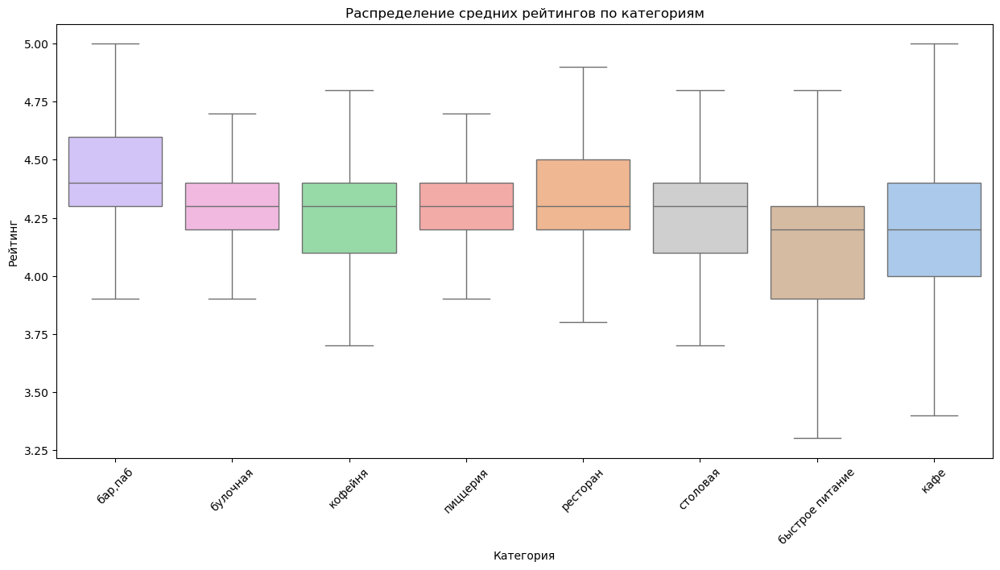

In [68]:
ratings = data.groupby('category', as_index = False)['rating'].median().sort_values(by = 'rating', ascending = False)['category'].tolist()
display(ratings)

plt.figure(figsize = (15, 7))
sns.stripplot(x = 'category', y = 'rating', hue = 'category', data = data, palette = 'pastel', order = ratings)
plt.xticks(rotation = 45)
plt.title('Распределение средних рейтингов по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.legend().remove()
plt.show()

plt.figure(figsize = (15, 7))
sns.boxplot(x = 'category', y = 'rating', hue = 'category', data = data, palette = 'pastel', order = ratings, showfliers = False)
plt.xticks(rotation = 45)
plt.title('Распределение средних рейтингов по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.legend().remove()
plt.show()

Распределения у категорий похожи. По диаграмме рассеяния видна обильность данных у категорий "кафе", "ресторан" и "быстрое питание". По графику-скрипке видно что самое высокое значение чаще попадается у баров/пабов. Возможно, там повышенная конкуренция. Самые длинные "хвосты" у категорий "кафе", "быстрое питание" и "ресторан", это говорит о том, что в заведениях этих категорий больше всего "выбросов" в среднем рейтинге.

---

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [72]:
data_rating = data.groupby('district', as_index = False)['rating'].mean()
data_rating

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [73]:
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

На карте отчетливо видно, что высший рейтинг из всех округов у ЦАО. Далее идут САО, СЗАО и тд. Самые худшие рейтинги у заведений ЮВАО. Возможно, по причине того что это промышленный округ.

---

### Все заведения Москвы на карте

In [79]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

Можно заметить, что больше всего заведений находится в ЦАО и близи нее. Меньше всего приблизительно в ЮВАО.

---

### Топ-15 улиц по количеству заведений

In [84]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,низкие,NaN,550.0,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,183.0
профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0,77.0
варшавское шоссе,6.0,0.0,7.0,17.0,14.0,4.0,20.0,7.0,75.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0,69.0


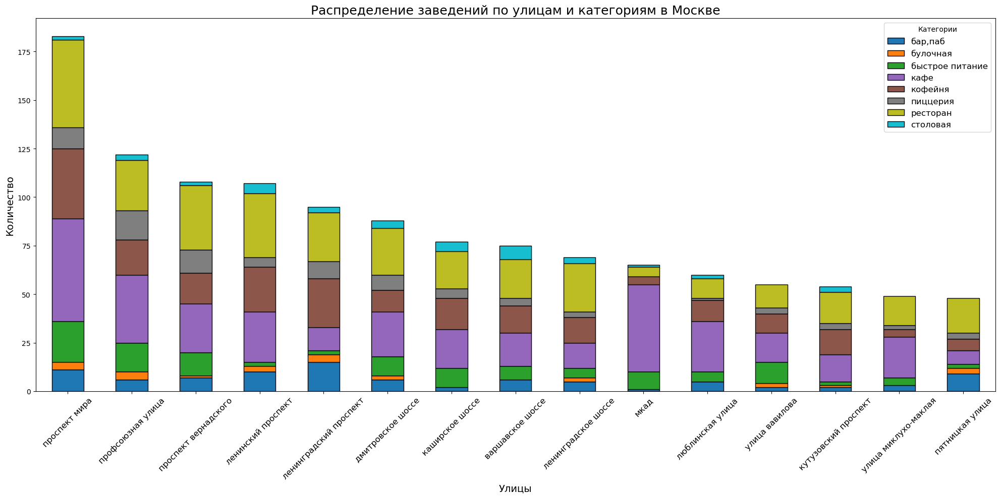

In [85]:
streets = (data.groupby('street', as_index = False)['name']
           .count()
           .rename(columns = {'name':'count'})
           .sort_values(by = 'count', ascending = False)
           .head(15)
          .reset_index(drop = True))
streets = streets['street'].tolist()
streets
data_street = data.loc[data['street'].isin(streets), :].reset_index(drop = True)
pivot_street = pd.pivot_table(data_street, index = 'street', columns = 'category', values = 'name', aggfunc = 'count').fillna(0)
pivot_street['total'] = pivot_street.sum(axis = 1)
pivot_street.sort_values(by = 'total', ascending = False, inplace = True)
display(pivot_street)

pivot_street.drop(columns = ['total']).plot(kind = 'bar', stacked = True, figsize=(20, 10), colormap='tab10', edgecolor='black')
plt.xticks(rotation=45, fontsize=12)
plt.title('Распределение заведений по улицам и категориям в Москве', fontsize=18)
plt.xlabel('Улицы', fontsize=14)
plt.ylabel('Количество', fontsize=14)
plt.legend(title='Категории', fontsize=12)
plt.tight_layout()
plt.show()

Самыми заполненными улицами оказались проспект мира, профсоюзная улица и проспект вернадского. Видим явное превосходтсво категорий "кафе" и "ресторан", далее идут "кофейня" и тд. Такой топ-15 получился скорее всего из-за относительно недорогой цены аренды, а также населенности и проходимости этих улиц. Ведь все улицы, которые здесь присутствуют, знакомы на слух.

---

### Улицы, на которых находится только один объект общепита

In [95]:
street_1 = data.groupby('street', as_index = False)['name'].count().rename(columns = {'name':'count'})
street_1 = street_1.query('count == 1')
streets = street_1['street'].tolist()

data_street_1 = data.query('street in @streets').reset_index(drop = True)
group_street_1 = data_street_1.groupby('district', as_index = False)['name'].count().rename(columns = {'name':'count'}).sort_values(by = 'count', ascending = True)
group_street_1

,district,count
7,Юго-Западный административный округ,17
4,Северо-Западный административный округ,18
1,Западный административный округ,33
6,Юго-Восточный административный округ,34
8,Южный административный округ,37
2,Северный административный округ,47
3,Северо-Восточный административный округ,49
0,Восточный административный округ,50
5,Центральный административный округ,137


In [96]:
fig = px.bar(group_street_1, y = 'district', x = 'count')
fig.update_layout(height = 700, width = 1000, title = 'Количество единичных на улице заведений по районам Москвы')
fig.update_xaxes(title = 'Количество')
fig.update_yaxes(title = 'Район')
fig.show()

Большинство находится в ЦАО. Причем с отрывом

In [101]:
gr_cat_1 = data_street_1.groupby('category', as_index = False)['name'].count().rename(columns = {'name':'count'})
gr_cat_1.sort_values(by = 'count', ascending = True, inplace = True)

fig = px.bar(gr_cat_1, y = 'category', x = 'count')
fig.update_layout(height = 700, width = 1000, title = 'Количество единичных на улице заведений по категориям')
fig.update_xaxes(title = 'Количество')
fig.update_yaxes(title = 'Категория')
fig.show()

Неудивительно, что больше всего заведений категории "кафе", далее рестораны и кофейня.

In [106]:
fig = px.histogram(data_street_1, x = 'rating')
fig.update_layout(height = 700, width = 1000, title = 'Распределение среднего рейтинга среди улиц с одним заведением')
fig.update_xaxes(title = 'Количество')
fig.update_yaxes(title = 'Категория')
fig.show()

Распределение рейтинга не удивляет, примерно такое же как и у общей массы заведений Москвы.

In [111]:
fig = px.histogram(data_street_1, y = 'price')
fig.update_layout(height = 700, width = 1000, title = 'Распределение ценовой категории среди улиц с одним заведением')
fig.update_xaxes(title = 'Количество')
fig.update_yaxes(title = 'Категория')
fig.show()

Хоть среди всех ценовых категорий лидирует "средние", но стоит отметить, что категория "низкие" имеет достаточно большой охват, не намного отставая от лидера.

In [116]:
fig = px.histogram(data_street_1, x = 'is_24_7')
fig.update_layout(height = 700, width = 1000, title = 'Распределение заведений, работающих круглосуточно, среди улиц с одним заведением')
fig.update_xaxes(title = 'Количество')
fig.update_yaxes(title = 'Категория')
fig.show()

Вывод: заведения, являющиеся единственными на своей улице, в большинстве находятся в ЦАО. Среди таких заведений категории распределены так же, как и общая масса. Больше всего категории "кафе", далее "ресторан". Дела с рейтингом обстоят похожим образом, распределение как у всех заведений вместе. Цены в основном "средние", либо "низкие". "Выше среднего" попадаются в три раза реже лидера, а "высокие" еще реже. Большинство заведений не работают круглосуточно, а только малая часть работает 24/7. Рекомендация: изучить ЦАО, понять причину почему так много улиц, где всего одно заведение. Дело в цене аренды или же в чем-то другом?

---

### Медианная стомость чека заведений по районам

In [123]:
data_bill = data.groupby('district', as_index = False)['middle_avg_bill'].median()
data_bill

,district,middle_avg_bill
0,Восточный административный округ,450.0
1,Западный административный округ,625.0
2,Северный административный округ,550.0
3,Северо-Восточный административный округ,475.0
4,Северо-Западный административный округ,650.0
5,Центральный административный округ,900.0
6,Юго-Восточный административный округ,400.0
7,Юго-Западный административный округ,450.0
8,Южный административный округ,600.0


In [124]:
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.4, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианная стомость чека заведений по районам',
).add_to(m)
m

Как и ожидалось, средний чек выше всего в ЦАО. В северо-восточных, юго-восточных и восточных районах чекни ниже всего. Но если пойти ближе к западу, то можно заметить, что чеки становятся выше. Особенно в СЗАО. Также в ЮАО чек выше среднего, если сравнивать с остальными районами.

---

### Заведения, чьи рейтинги больше 4.5

In [129]:
data45 = data.query('rating > 4.5')
data45.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,низкие,NaN,550.0,NaN,0,NaN,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,650.0,NaN,0,NaN,ижорская улица,False


1. Посмотрим на зависимость рейтинга и категории. Сравним с данными всех заведений.

In [131]:
df45 = data45.groupby('category', as_index = False)['name'].count().rename(columns = {'name':'count'}).sort_values(by = 'count', ascending = False)
fig = px.histogram(df45, x = 'category', y = 'count')
fig.update_layout(height = 500, width = 1200, title = 'Распределение количества заведений, чьи рейтинги выше 4.5, по категориям')
fig.update_xaxes(title = 'Категория')
fig.update_yaxes(title = 'Количество')
fig.show()

data_category = data.groupby('category', as_index = False)['name'].count().rename(columns = {'name':'count'}).sort_values(by = 'count', ascending = False)
fig1 = px.histogram(data_category, x = 'category', y = 'count')
fig1.update_layout(height = 500, width = 1200, title = 'Распределение количества всех заведений заведений по категориям')
fig1.update_xaxes(title = 'Категория')
fig1.update_yaxes(title = 'Количество')
fig1.show()

Видим, что среди заведений, чьи рейтинги выше 4.5, больше категории "ресторан", нежели "кафе" как среди всех заведений вместе взятых. Так же "бар, паб" находится выше относительно графика для общей массы.

2. Зависимость рейтинга и цен заведения. Сравним их с распределением цен для всех заведений.

In [137]:
df_price = data45.groupby('price', as_index = False)['name'].count().rename(columns = {'name':'count'}).sort_values(by = 'count', ascending = False)
fig = px.histogram(df_price, x = 'price', y = 'count')
fig.update_layout(height = 500, width = 1200, title = 'Распределение количества заведений, чьи рейтинги выше 4.5, по ценовым категориям')
fig.update_xaxes(title = 'Ценовая категория')
fig.update_yaxes(title = 'Количество')
fig.show()

data_price = data.groupby('price', as_index = False)['name'].count().rename(columns = {'name':'count'}).sort_values(by = 'count', ascending = False)
fig1 = px.histogram(data_price, x = 'price', y = 'count')
fig1.update_layout(height = 500, width = 1200, title = 'Распределение количества всех заведений заведений по ценовым категориям')
fig1.update_xaxes(title = 'Ценовая категория')
fig1.update_yaxes(title = 'Количество')
fig1.show()

Сильной разницы нет, но среди высокорейтинговых заведений категория "высокие" попадаются чаще, а "выше среднего" реже.

3. Сравним средний чек.

In [143]:
fig = px.histogram(data45, x = 'middle_avg_bill', title = 'Заведения с рейтингом выше 4.5')
fig.update_xaxes(range = [0, 4000])
fig.show()

fig1 = px.histogram(data, x = 'middle_avg_bill', title = 'Все заведения')
fig1.update_xaxes(range = [0, 4000])
fig1.show()

Распределения похожи, но видно, что нет резкого роста среди цен до 500, как среди всех заведений.

---

<a id="4"></a>

## Общий вывод

Нам был дан кейс, и мы провели предобработку данных, проанализировали предоставленные данные, ответили на вопросы, которые помогут при открытии кофейни. В процессе предобработки выяснили, что явных и неявных дубликатов нет. Было множество пропусков, некоторые из них мы заменили. А именно столбцы middle_avg_bill и seats мы заменили на медианные значения той же категории заведения и в том же районе. Столбец price мы заменили путем анализа категорий, которые в нем уже присутствовали. Добавили столбцы с названием улицы и информацией о том, является ли заведение круглосуточным. Далее мы анализировали и визуализировали данные. Выяснили:
* Выделяется тройка лидеров среди категорий по количеству заведений: кафе, ресторан и кофейня. Меньше всего заведений с категорией "булочная". +
* Больше всего посадочных мест у ресторанов, баров/пабов, столовых. Меньше всего у заведений с категорией "булочная".
* Доля сетевых заведений на рынке: 0,381. Несетевых: 0,619.+
* Доли категорий среди сетевых и несетевых заведений отличается. На первом месте у обоих категория "кафе", однако в несетевых разница между категориями "Ресторан" и "Кофейня" равна почти 12%, когда в сетевых разница составляет всего 0,3%. В несетевых категория "Бар, паб" находится на одну позицию выше чем "Пиццерия", а в сетевых наоборот, причем доли равны соответственно позиции. Также в сетевых местами поменялись категории "Столовая" и "Булочная". Сетевыми чаще всего являются такие заведения: ресторан, кафе и кофейня. Реже всего: бар/паб, столовая и булочная.
* Среди топ-15 сетей заведений: на первом месте сеть "Шоколадница" с 120 заведениями, на 15 месте сеть "Му-Му" с 27 заведениями. Больше всего заведений категории "кофейня". В топ-15 вошли категории: кофейня, кафе, ресторан, пиццерия, булочная(в порядке убывания по количеству категорий из топ-15). Большинство заведений из топ-15 сетей находится в Центральном административном округе.
* Высокий рейтинг чаще попадается у баров/пабов. У категорий "кафе", "быстрое питание" и "столовая" больше всего "выбросов" в среднем рейтинге. +
* Высший рейтинг из всех округов у ЦАО. Далее идут САО, СЗАО и тд. Самые худшие рейтинги у заведений ЮВАО. +
* Больше всего заведений находится в ЦАО и близи нее. Меньше всего приблизительно в ЮВАО. +
* Категория "ресторан" среди топ-15 улиц по количеству заведений занимает лидерство. На втором и третьем месте категории "кофейня" и "быстрое питание" соответственно. На четвертом категория "кафе".+
* Заведения, являющиеся единственными на своей улице, в большинстве находятся в ЦАО. Цены в основном "средние", либо "низкие". "Выше среднего" попадаются в три раза реже лидера, а "высокие" еще реже. В остальном критической разницы с общей массой нет.
* Средний чек выше всего в ЦАО. В северо-восточных, юго-восточных и восточных районах чекни ниже всего. Ближе к западу чеки становятся выше. Особенно в СЗАО. Также в ЮАО чек выше среднего. +
* Заведения, чьи рейтинги выше 4.5, больше категории "ресторан", нежели "кафе" как среди всех заведений вместе взятых. Так же заведений с категорией "бар, паб" попадются чаще относительно положения среди всех заведений. Среди высокорейтинговых заведений категория "высокие" попадаются чаще, а "выше среднего" реже.

Так же были построены фоновые картограммы и указаны кластеры с маркерами заведений на карте для более подробного анализа.

Рекомендации заказчику:
* Изучить ЦАО, понять причину почему так много улиц, где всего одно заведение. Дело в цене аренды или же в чем-то другом?
* Изучить районы, в которых нет большинства заведений из топ-15 сетей.

---

<a id="5"></a>

## Детализируем исследование: открытие кофейни

---

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [153]:
coffee = data.query('category == "кофейня"').reset_index(drop = True)
coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,низкие,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица маршала федоренко,False
1,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,низкие,NaN,325.0,NaN,1,NaN,NaN,False
2,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,низкие,NaN,325.0,NaN,1,46.0,коровинское шоссе,False
3,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,низкие,NaN,325.0,NaN,1,NaN,улица маршала федоренко,False
4,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,низкие,NaN,325.0,NaN,1,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1408,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,низкие,NaN,250.0,NaN,0,NaN,люблинская улица,False
1409,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,низкие,Цена чашки капучино:100–220 ₽,250.0,160.0,0,206.0,волгоградский проспект,False
1410,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,низкие,NaN,250.0,NaN,0,NaN,грайвороновская улица,False
1411,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,низкие,Цена чашки капучино:80–120 ₽,250.0,100.0,0,NaN,новохохловская улица,False


In [154]:
print('Всего кофеен:', len(coffee))

Всего кофеен: 1413


In [155]:
cof_gr = coffee.groupby('district', as_index = False)['name'].count().rename(columns = {'name':'count'})
cof_gr['total'] = cof_gr['count'].sum()
cof_gr['share'] = round(cof_gr['count'] / cof_gr['total'], 2)
cof_gr = cof_gr.drop(columns = ['total'])
display(cof_gr)

fig1 = px.bar(cof_gr.sort_values(by = 'count', ascending = False), x = 'district', y = 'count', height = 500)
fig1.update_layout(height = 500, width = 1200, title = 'Распределение количества кофеен по районам Москвы')
fig1.update_xaxes(title = 'Район')
fig1.update_yaxes(title = 'Количество')
fig1.show()

fig2 = px.pie(cof_gr, names = 'district', values = 'count', height = 500)
fig2.update_layout(height = 500, width = 1000, title = 'Распределение по долям количества кофеен Москвы')
fig2.show()

,district,count,share
0,Восточный административный округ,105,0.07
1,Западный административный округ,150,0.11
2,Северный административный округ,193,0.14
3,Северо-Восточный административный округ,159,0.11
4,Северо-Западный административный округ,62,0.04
5,Центральный административный округ,428,0.30
6,Юго-Восточный административный округ,89,0.06
7,Юго-Западный административный округ,96,0.07
8,Южный административный округ,131,0.09


In [159]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)

m

Всего кофеен 1413. Больше всего в ЦАО. После ЦАО по количеству кофеен идут северные, западные, северо-восточные районы. Меньше всего в СЗАО.

---

### Есть ли круглосуточные кофейни?

In [163]:
cof_24 = coffee.query('is_24_7 == True').reset_index(drop = True)
cof_24.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,низкие,NaN,325.0,NaN,1,20.0,дмитровское шоссе,True
1,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,низкие,NaN,325.0,NaN,1,25.0,ярославское шоссе,True
2,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,низкие,Цена чашки капучино:140–200 ₽,325.0,170.0,1,NaN,ярославское шоссе,True
3,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,низкие,NaN,325.0,NaN,1,NaN,мкад,True
4,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True


In [164]:
cof_group = cof_24.groupby('district', as_index = False)['name'].count().rename(columns = {'name':'count'}).sort_values(by='count', ascending = False)

fig = px.bar(cof_group, x = 'district', y = 'count')
fig.update_layout(height = 500, width = 1100, title = 'Распределение кофеен, работающих круглосуточно, по районам Москвы')
fig.update_xaxes(title = 'Район')
fig.update_yaxes(title = 'Количество')
fig.show()

Есть круглосуточные кофейни. Больше всего их в ЦАО, далее идут ЗАО и ЮЗАО. Меньше всего в ЮАО.

---

### Зависимость работы 24/7 и рейтинга

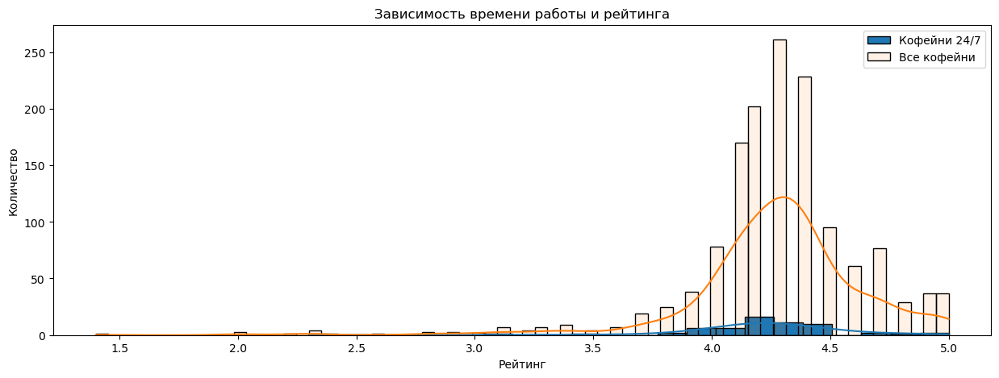

In [171]:
plt.figure(figsize = (15, 5))
sns.histplot(x = 'rating', data = cof_24, alpha = 1, kde = True, label = 'Кофейни 24/7')
sns.histplot(x = 'rating', data = coffee, alpha = 0.1, kde = True, label = 'Все кофейни')
plt.title('Зависимость времени работы и рейтинга')
plt.xlabel('Рейтинг')
plt.ylabel('Количество')
plt.legend()
plt.show()


In [172]:
fig = px.histogram(data.query('category == "кофейня"'),
                   x = 'rating',
                  color = 'is_24_7',
                  barmode = 'overlay')
fig.update_layout(height = 500, width = 1200, title = 'Зависимость времени работы и рейтинга')
fig.update_xaxes(title = 'Рейтинг')
fig.update_yaxes(title = 'Количество')
fig.show()

Данных оказалось слишком мало, чтобы делать выводы. Но можно сказать, что пропорционально рейтинг 4.2 встречается чаще чем 4.3, как в кофейнях, работающих не круглосуточно.

---

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [179]:
fig = px.histogram(coffee, x = 'rating')
fig.update_layout(height = 500, width = 1200, title = 'Распределение среднего рейтинга среди кофеен Москвы')
fig.update_xaxes(title = 'Рейтинг')
fig.update_yaxes(title = 'Количество')
fig.show()

In [183]:
state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.4, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

Чаще всего попадается рейтинг 4,3. В районах СВАО и ВАО рейтинги выше, чем у остальных районов. Далее идут СЗАО и ЮВАО.

---

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

/var/folders/td/s_0q2gb952xg9pgq3lhgqw740000gn/T/ipykernel_50575/1917838292.py:11: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



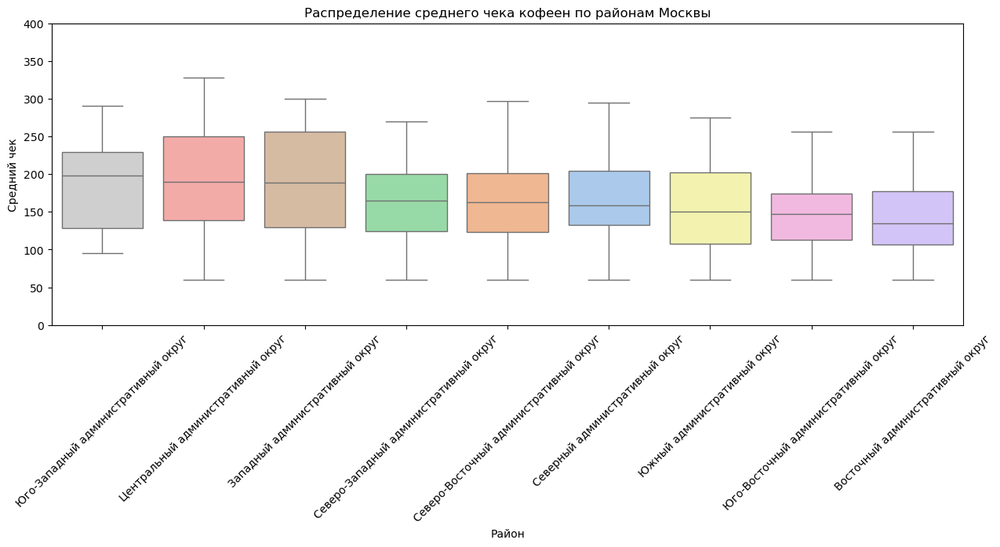

/var/folders/td/s_0q2gb952xg9pgq3lhgqw740000gn/T/ipykernel_50575/1917838292.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



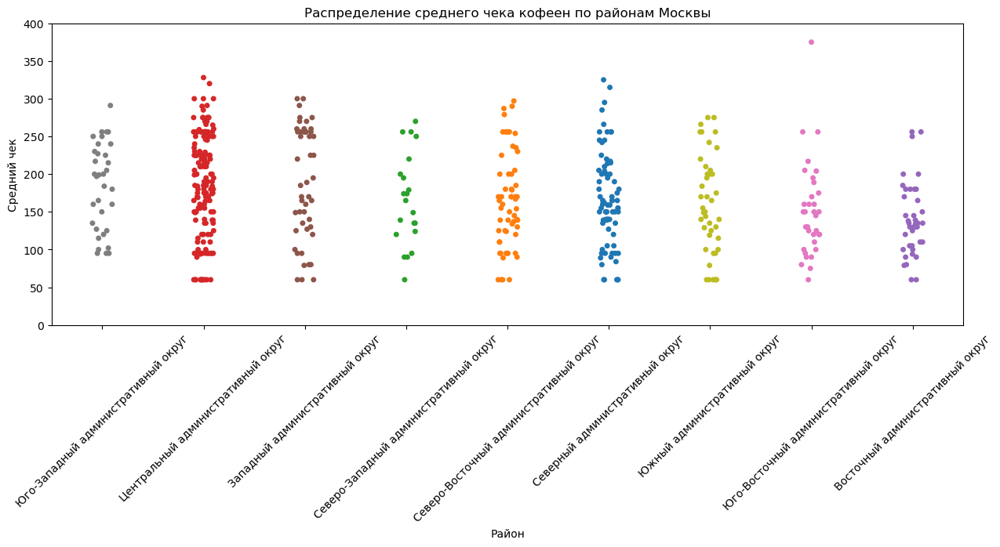

In [187]:
coffee_median = coffee.groupby('district', as_index = False)['middle_coffee_cup'].median().sort_values(by = 'middle_coffee_cup', ascending = False)
medians = coffee_median['district'].tolist()

plt.figure(figsize = (15, 5))
sns.boxplot(x = 'district', y = 'middle_coffee_cup', hue = 'district', palette = 'pastel', data = coffee, order = medians, showfliers = False)
plt.title('Распределение среднего чека кофеен по районам Москвы')
plt.ylabel('Средний чек')
plt.xlabel('Район')
plt.xticks(rotation = 45)
plt.ylim(0, 400)
plt.legend().remove()
plt.show()

plt.figure(figsize = (15, 5))
sns.stripplot(x = 'district', y = 'middle_coffee_cup', hue = 'district', data = coffee, order = medians)
plt.title('Распределение среднего чека кофеен по районам Москвы')
plt.ylabel('Средний чек')
plt.xlabel('Район')
plt.xticks(rotation = 45)
plt.ylim(0, 400)
plt.legend().remove()
plt.show()

In [191]:
cof_cup = coffee.groupby('district', as_index = False)[['middle_coffee_cup']].median().sort_values('middle_coffee_cup', ascending = False).reset_index(drop = True)
display(cof_cup)

state_geo = 'admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.4, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=cof_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианная стоимость чашки капучино по районам',
).add_to(m)
m

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


## Общий вывод

* Всего кофеен 1413. Больше всего в ЦАО. После ЦАО по количеству кофеен идут северные, западные, северо-восточные районы. Меньше всего в СЗАО.
* Есть круглосуточные кофейни. Больше всего их в ЦАО, далее идут ЗАО и ЮЗАО. Меньше всего в ЮАО.
* Чаще всего попадается рейтинг 4,3. В районах СВАО и ВАО рейтинги выше, чем у остальных районов. Далее идут СЗАО и ЮВАО.
* Цена одной чашки при открытии зависит от местоположения заведения. Самый дорогостоящий кофе в районах: ЮЗАО, ЦАО и ЗАО, около 198, 190 и 189 рублей за чашку соответственно. СЗАО: 165 руб., СВАО: 162,5 руб., САО: 159 руб., ЮАО: 150 руб., ЮВАО: 147,5 руб., ВАО: 135 руб.

Рекомендации:
* Поскольку большинство кофеен находится в ЦАО, то для первой кофейни стоит рассмотреть другие районы, где меньше предложения и конкурентности.
* Круглосуточных кофеен в Москве не так много. Можно предположить, что на них спрос не так уж и велик. Поэтому этот вариант не так важен при открытии.
* Рассмотрев распределение рейтингов, можно предположить, какие районы именно стоит рассмотреть поближе. Это районы САО, ЮАО. Поскольку там достаточно маленькое количество подобных заведений, и рейтинги ниже остальных районов. Это может означать, что в тех районах как нигде есть спрос на хорошую кофейню!